# GeneralisedFilters.jl: Efficient Inference for State Space Models

This notebook introduces `GeneralisedFilters.jl`, a component of the Turing.jl ecosystem specialising in efficient inference on state space models.

It is intended to provide a high-level run-through of the expansive feature set that the package offers through the lens of a case study on trend inflation modelling.

`GeneralisedFilters.jl` is still under active development so you can expect the API to be refined over time as we move from first-pass implementations to more robust versions.

## State Space Models

In the previous notebooks we looked at using Hamiltonian Monte Carlo (and its variants, such as NUTS) to perform parameter inference on general Bayesian models. 

Part of the power of HMC is its generality. You can define essentially any probabalistic model you like, and HMC will be able to sample from the posterior distribution of its parameters.

<img src="bayesian_network.png" width="400px"/>

_An arbitrary Bayesian model I found on ResearchGate_.



State space models impose a more restrictive structure: 

- a **latent Markov process** $x_{1:K}$ that evolves over time
- coupled with **conditionally independent observations** $y_{1:K}$.

<img src="state_space_model.png" width="1000px"/>

The generative model for a state space model can be broken up into three parts:

$$
\begin{align*}
x_0 &\sim p_\theta(x_0) \quad &&\text{(State prior)} \\
x_k &\sim p_\theta(x_k \mid x_{k-1}) \quad &&\text{(Latent dynamics)} \\
y_k &\sim p_\theta(y_k \mid x_k) \quad &&\text{(Observations)}
\end{align*}
$$

Here $\theta$ are **model hyperparameters** which may be fixed (known) or unknown (to be inferred).

The most common inference tasks in state space models are:

- **Filtering**: Estimate current state given past observations: $p(x_k \mid y_{1:k})$
- **Smoothing**: Estimate past states given all observations: $p(x_k \mid y_{1:K})$ for $k < K$
- **Parameter inference**: Infer static parameters $\theta$ in the dynamics or observation processes

`GeneralisedFilters.jl` provides efficient algorithms for all of these tasks, but we will focus on filtering (with a touch of parameter inference) in this notebook.

**Why Not Just Use HMC?**

The Markov structure of SSMs can be exploited by specialised algorithms (e.g., Kalman filter, particle filters) that are often much more efficient than general-purpose methods.

HMC can still be applied to SSMs, but may not leverage the temporal structure optimally—especially for long time series.

## Motivation for GeneralisedFilters.jl

The goal of GeneralisedFilters.jl is to provide modular components for building state-of-the-art SSM inference algorithms whilst ensuring high computational efficiency.

The primary design philosophy of the package is to treat Rao-Blackwellisation—a power techinque for reduce the effective dimensionality of SSM inference problems—as a first-class citizen.

This is of great importance since inference techniques for general SSMs (e.g., particle filters) scale poorly with the dimension of the latent state space, potentially requiring exponential compute.

The majority of SSM inference packages do not natively support Rao-Blackwellisation.

And even those that do often implement it in a rigid manner, typically forcing you to use a pre-specified combination of component algorithms.

<img src="GF_motivation_1.png" width="1000px"/>


In GeneralisedFilters.jl, however, Rao-Blackwellisation is implemented in a highly modular fashion, allowing users to easily mix-and-match different algorithms.

<img src="GF_motivation_2.png" width="1000px"/>

## Case Study: Trend Inflation

TODO: Charles to introduce model and data

## Setup

In [1]:
import Pkg
Pkg.activate(".")

  Activating new project at `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/part3`


In [2]:
Pkg.add([
    "AdvancedMH",
    "BenchmarkTools",
    "CSV",
    "DataFrames",
    "Distributions",
    "GeneralisedFilters",
    "LaTeXStrings",
    "LogExpFunctions",
    "MatrixEquations",
    "PDMats",
    "Plots",
    "SSMProblems",
    "StaticArrays",
    "Statistics",
    "StatsBase",
    "Turing"
])

   Resolving package versions...
   Installed MappedArrays ─ v0.4.3
    Updating `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/part3/Project.toml`
  [5b7e9947] + AdvancedMH v0.8.9
  [6e4b80f9] + BenchmarkTools v1.6.3 [loaded: v1.6.0]
  [336ed68f] + CSV v0.10.15
  [a93c6f00] + DataFrames v1.8.1
  [31c24e10] + Distributions v0.25.122
  [3ef92589] + GeneralisedFilters v0.4.1
  [b964fa9f] + LaTeXStrings v1.4.0
  [2ab3a3ac] + LogExpFunctions v0.3.29
  [99c1a7ee] + MatrixEquations v2.5.6
  [90014a1f] + PDMats v0.11.36
  [91a5bcdd] + Plots v1.41.2
  [26aad666] + SSMProblems v0.6.1
  [90137ffa] + StaticArrays v1.9.15
  [10745b16] + Statistics v1.11.1
  [2913bbd2] + StatsBase v0.34.9
  [fce5fe82] + Turing v0.42.0
    Updating `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/part3/Manifest.toml`
  [47edcb42] + ADTypes v1.20.0
  [621f4979] + AbstractFFTs v1.5.0
  [80f14c24] + AbstractMCMC v5.10.0
  [7a57a42e] + AbstractPPL v0.13.6
  [1520ce14] + AbstractTrees v0.4.5
  [6a4ca0a5] + Ac

In [3]:
using Random
rng = MersenneTwister(1234);

### Data Loading

In [4]:
using CSV, DataFrames

fred_data = CSV.read("fred_data.csv", DataFrame)

Row,date,pce,gdp,unrate
,Date,Float64,Float64,Float64
1,1960-01-01,0.41456,816.542,5.4
2,1960-04-01,2.04062,816.002,5.4
3,1960-07-01,1.6199,816.49,5.5
4,1960-10-01,1.8944,815.199,6.6
5,1961-01-01,0.20426,815.872,6.9
6,1961-04-01,0.17865,817.555,6.9
7,1961-07-01,1.65505,819.458,6.7
8,1961-10-01,0.10163,821.4,6.0
9,1962-01-01,2.35556,823.168,5.6


In [5]:
K = length(fred_data.gdp)

255

### Preliminary: Static Arrays

GeneralisedFilters.jl provides extensive support for [StaticArrays.jl](https://github.com/JuliaArrays/StaticArrays.jl), a framework for stack-allocated, fixed-size arrays in Julia.

This is particularly useful for state space models with low-dimensional states (roughly $D \leq 10$), where the overhead of heap allocation can be significant.

In [6]:
using BenchmarkTools
using LinearAlgebra
using StaticArrays

A = rand(4, 4)
B = @SMatrix rand(4, 4)

println("Benchmark timings for base Julia arrays: ")
@btime det($A);
println("\nBenchmark timings for StaticArrays: ")
@btime det($B);

Benchmark timings for base Julia arrays: 
  134.449 ns (4 allocations: 304 bytes)

Benchmark timings for StaticArrays: 
  2.964 ns (0 allocations: 0 bytes)


If you define your state space models to use `StaticArrays`, GeneralisedFilters.jl preverse this type information and performs all computations using `StaticArrays`.

### Preliminary: Type Parameters

Julia typically performs best when types are concrete (specific size and memory layout). Using abstract types in struct fields can severely hurt performance:

```julia
struct MyStruct
    x::Vector  # Abstract — Vector is shorthand for Vector{T} where T
end
```

When a `MyStruct` is created, Julia doesn't know the concrete type of `x` (e.g., `Vector{Float64}` vs `Vector{Int}`), so it has to insert runtime type checks and cannot specialise code for specific types.

Instead, we can use type parameters to allow our code to be flexible while still being concrete:

```julia
struct MyStruct{T}
    x::Vector{T}
end
```

Now the compiler can specialize code for each concrete type (e.g., `MyStruct{Float64}`), enabling optimizations and avoiding runtime type checks.

## Linear Gaussian Models: The Kalman Filter

We start by looking at a class of state space models that have a closed-form filtering/smoothing distribution.

This is the class of linear Gaussian state space models (LGSSMs). The model is defined as follows:

\begin{align*}
x_0 &\sim \mathcal{N}(\mu_0, \Sigma_0) \\
x_k &= A_k x_{k-1} + b_k + q_k, \quad &q_k \sim \mathcal{N}(0, Q_k) \\
y_k &= H_k x_k + c_k + r_k, \quad &r_k \sim \mathcal{N}(0, R_k)
\end{align*}

where the model matrices $A_k$, $b_k$, $Q_k$, $H_k$, $c_k$ and $R_k$ may be time-varying.



It can be showed that the filtering distribution $p(x_k | y_{1:k})$ remains Gaussian for all $k$, and can be computed exactly using the Kalman filter algorithm. This is a recursive algorithm that proceeds in two steps at each time $k$:
1. **Prediction step:** Compute the predictive distribution $p(x_k | y_{1:k-1})$ using the state dynamics.
2. **Update step:** Update the predictive distribution to obtain the filtering distribution $p(x_k | y_{1:k})$ using the new observation $y_k$.

### Model Definition

In [7]:
using GeneralisedFilters
using SSMProblems  # defines StateSpaceModel and non-specialised dynamics/observations
using PDMats: PDMat

const GF = GeneralisedFilters;

We start by defining our latent dynamics. We do this by defining a struct that subtypes `LinearGaussianLatentDynamics`.

This type lets `GeneralisedFilters.jl` know that the latent dynamics are linear and Gaussian, allowing it to use the Kalman filter for inference.

All we then have to specify is how the model parameters `A_k`, `b_k`, and `Q_k` are generated at each time step.

In [8]:
struct TrendCycleDynamics{ΦT,ΚT} <: LinearGaussianLatentDynamics
    m::Int64
    n::Int64
    ϕ::ΦT
    σκ²::ΚT
end

In [9]:
# Our dynamics are time-invariant, so we can just return the same A, b at each time step
GF.calc_A(cycle::TrendCycleDynamics, ::Integer; kwargs...) = cycle.ϕ

function GF.calc_b(cycle::TrendCycleDynamics{ΦT}, ::Integer; kwargs...) where {ΦT}
    return zeros(eltype(ΦT), cycle.m + 2 * cycle.n)
end

Keyword arguments (`kwargs...`) can be used when defining SSM dynamics to allow for behaviour defined at inference time.

For example, we could supply the time deltas (`dt`s) between observations in irregularly sampled data.

In preparation for our later Rao-Blackwellised model, we will pass in the fixed volatilities vector using the name `new_outer`. This is admittedly a bit clunky and is soon to be replaced with a more elegant solution.

We also currently require that the covariance matrix `Q_k` is returned as a `PDMat` type, which ensures that it is always positive definite. This is normally no effort, but for this specific model, we have degenerate (zero) process noise for some state dimensions, which requires special handling.

In the future, this restriction will be relaxed so that singular covariance matrices can be used directly.

In [10]:
function GF.calc_Q(
    cycle::TrendCycleDynamics{ΦT,ΚT}, ::Integer; new_outer, kwargs...
) where {ΦT,ΚT}
    vols = new_outer
    T = Base.promote_type(eltype(ΦT), ΚT, eltype(vols))
    Σ = zeros(T, cycle.m + 2 * cycle.n, cycle.m + 2 * cycle.n)
    Σ[1:(cycle.m), 1:(cycle.m)] .= exp(vols[1])
    Σ[(end-1):end, (end-1):end] = cycle.σκ² * I(2)

    cholΣ = zero(Σ)
    cholΣ[1:(cycle.m), 1:(cycle.m)] .= exp(vols[1] / 2)
    cholΣ[(end-1):end, (end-1):end] = sqrt(cycle.σκ²) * I(2)

    return PDMat(Σ, Cholesky(UpperTriangular(cholΣ)))
end

Likewise, we can define our observation model by subtyping `LinearGaussianObservations` and implementing the required methods.

In [11]:
struct TrendObservation{T<:Real} <: LinearGaussianObservationProcess
    m::Int64
    n::Int64
end

In [12]:
function GF.calc_H(obs::TrendObservation{T}, ::Integer; kwargs...) where {T}
    return [ones(T, 1); zeros(T, obs.m - 1); ones(T, 1); zeros(T, 2 * obs.n - 1);;]'
end

In [13]:
function GF.calc_c(obs::TrendObservation{T}, ::Integer; kwargs...) where {T}
    # Could make this a lazy zero from FillArrays.jl for efficiency
    return zeros(T, 1)
end

In [14]:
function GF.calc_R(::TrendObservation, ::Integer; new_outer, kwargs...)
    vols = new_outer
    return PDMat([exp(vols[2]);;])
end

Finally, we can define our state prior and combine this with our dynamics and observation models to create a complete state space model.

In this case, our prior doesn't depend on any inference time arguments so we simply compute appropriate values for $\mu_0$ and $\Sigma_0$ and pass these to `HomogeneousGaussianPrior`.

We then use `StateSpaceModel` to combine the prior, dynamics, and observation models into a complete SSM.

In [15]:
using MatrixEquations: lyapd

function stochastic_cyle(n::Int64, ρ::Real, λ::Real)
    cosλ = cospi(λ)
    sinλ = sinpi(λ)

    ϕ = kron(I(n), ρ * [cosλ sinλ; -sinλ cosλ])
    ϕ += kron(diagm(1 => ones(n - 1)), I(2))

    return ϕ
end

function stochastic_trend(m::Int64)
    return UpperTriangular(ones(Bool, m, m))
end

function create_bandpass_model(
    n::Int64, m::Int64, ρ::Real, λ::Real, γ::ΓT, σκ²::Real, init_state::Real
) where {ΓT<:Real}
    ϕ1 = stochastic_trend(m)
    ϕ2 = stochastic_cyle(n, ρ, λ)

    Σ1 = 1000I(m)
    Σ2 = lyapd(ϕ2, kron(Diagonal([zeros(eltype(ϕ2), n - 1); one(eltype(ϕ2))]), σκ² * I(2)))

    μ0 = [init_state; zeros(m - 1 + 2 * n)]
    Σ0 = PDMat(cat(Σ1, Σ2; dims=(1, 2)))

    bandpass_model = StateSpaceModel(
        HomogeneousGaussianPrior(μ0, Σ0),
        TrendCycleDynamics(m, n, cat(ϕ1, ϕ2; dims=(1, 2)), σκ²),
        TrendObservation{eltype(ϕ2)}(m, n),
    )
end;

We can then pick some sensible model parameters and create an instance of our model.

In [16]:
# Model parameters
m = 2
n = 2
ρ = 0.714
λ = 0.352
γ = 1.5
σκ² = 2.54
init_state = 816.542
average_historic_vols = [0.0198, 0.0138]

bandpass_model = create_bandpass_model(n, m, ρ, λ, γ, σκ², init_state);

We perform filtering one iteration at a time, so that it's easier for us to store the intermediate filtering distributions.

In [17]:
kf = KalmanFilter(jitter=1e-8)  # add a small jitter for numerical stability

kalman_posteriors = []
state = initialise(prior(bandpass_model), kf)
for k in 1:K
    obs = [fred_data.gdp[k]]  # treat as a 1-dimensional vector
    state, _ = GF.step(bandpass_model, kf, k, state, obs; new_outer=average_historic_vols)
    push!(kalman_posteriors, state)
end

MethodError: MethodError: no method matching step(::StateSpaceModel{HomogeneousGaussianPrior{Vector{Float64}, PDMat{Float64, Matrix{Float64}}}, TrendCycleDynamics{Matrix{Float64}, Float64}, TrendObservation{Float64}}, ::KalmanFilter, ::Int64, ::Distributions.FullNormal, ::Vector{Float64}; new_outer::Vector{Float64})
The function `step` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  step(!Matched::AbstractRNG, !Matched::AbstractStateSpaceModel, !Matched::GeneralisedFilters.AbstractParticleFilter, !Matched::Integer, ::Any, !Matched::Any; ref_state, callback, kwargs...)
   @ GeneralisedFilters ~/.julia/packages/GeneralisedFilters/nlVUn/src/algorithms/particles.jl:147
  step(!Matched::AbstractRNG, !Matched::AbstractStateSpaceModel, !Matched::AuxiliaryParticleFilter, !Matched::Integer, ::Any, !Matched::Any; ref_state, callback, kwargs...)
   @ GeneralisedFilters ~/.julia/packages/GeneralisedFilters/nlVUn/src/algorithms/particles.jl:330
  step(!Matched::AbstractRNG, !Matched::AbstractStateSpaceModel, !Matched::GeneralisedFilters.AbstractFilter, !Matched::Integer, ::Any, !Matched::Any; kwargs...)
   @ GeneralisedFilters ~/.julia/packages/GeneralisedFilters/nlVUn/src/GeneralisedFilters.jl:100


In [18]:
# An example posterior
kalman_posteriors[5]

BoundsError: BoundsError: attempt to access 0-element Vector{Any} at index [5]

We can then plot these filtered distributions alongside the observed data.

In [19]:
using Plots
using Plots.PlotMeasures
using Dates

# Extract the means and standard deviations from the Kalman posteriors
posterior_means = [state.μ[1] for state in kalman_posteriors]
posterior_stds = [sqrt(state.Σ[1, 1]) for state in kalman_posteriors]

# Plot the filtered trend with uncertainty bands
p = plot(
    fred_data.date, posterior_means,
    ribbon=1.96 * posterior_stds,
    label="Filtered Trend (95% CI)",
    xlabel="Time",
    ylabel="Trend Inflation",
    title="Kalman Filter: Estimated Trend Inflation",
    legend=:best,
    fillalpha=0.3,
    margin=3mm
)

# Overlay the observed data
plot!(
    fred_data.date, fred_data.gdp,
    label="Observed GDP",
    linestyle=:dot,
    linewidth=2
)

# Create inset plot for 2019-2020
inset_indices = findall(x -> year(x) >= 2019 && year(x) <= 2020, fred_data.date)
plot!(
    p,
    inset=(1, bbox(0.05, 0.1, 0.4, 0.35, :bottom, :right)),
    subplot=2,
    bg_inside=:white
)

plot!(
    fred_data.date[inset_indices], posterior_means[inset_indices],
    ribbon=1.96 * posterior_stds[inset_indices],
    subplot=2,
    label="",
    fillalpha=0.3,
    xlabel="",
    ylabel="",
    title="2019-2020 Detail",
    titlefontsize=9,
    tickfontsize=5,
    framestyle=:box
)

plot!(
    fred_data.date[inset_indices], fred_data.gdp[inset_indices],
    subplot=2,
    label="",
    linestyle=:dot,
    linewidth=2
)

display(p)

BoundsError: BoundsError: attempt to access 0-element Vector{Any} at index [[237, 238, 239, 240, 241, 242, 243, 244]]

Note that the trend inflation component is sharply pulled down by the observation in early 2020. This is a result of assuming fixed volatilities; we will address this in the next section by introducing stochastic volatility.

## Stochastic Volatility: Hierarchical Models and the Particle Filter

We extend our previous model by allowing the volatilities to evolve stochastically over time.

Specifically, we model both the trend and observation volatilities using log-normal stochastic as random walks:
\begin{align*}
\log \sigma_{\eta, k} &= \log \sigma_{\eta, k-1} + \eta_{\text{trend}, k}, \quad &\eta_{\text{trend}, k} \sim \mathcal{N}(0, \tau_{\text{trend}}^2) \\
\log \sigma_{\epsilon, k} &= \log \sigma_{\epsilon, k-1} + \epsilon_{\text{obs}, k}, \quad &\epsilon_{\text{obs}, k} \sim \mathcal{N}(0, \tau_{\text{obs}}^2)
\end{align*}

We define these below using `SSMProblems.jl`, a companion package to `GeneralisedFilters.jl` that provides provides a minimal inferace for generic state space model definitions.

That is, if you are defining a model with any special structure (e.g., linear Gaussian components), you should use `GeneralisedFilters.jl` directly, otherwise `SSMProblems.jl` can be used which integrates more widely with the Turing.jl ecosystem.

In [20]:
using Distributions

struct StochasticVolatilityPrior{T<:Real} <: StatePrior end

function SSMProblems.distribution(prior::StochasticVolatilityPrior{T}; kwargs...) where {T}
    return product_distribution(Normal(zero(T), T(1)), Normal(zero(T), T(1)))
end

In [21]:
struct StochasticVolatility{ΓT<:AbstractVector} <: LatentDynamics
    γ::ΓT
end

function SSMProblems.distribution(
    proc::StochasticVolatility, step::Integer, state::AbstractVector{T}; kwargs...
) where {T<:Real}
    μ = state
    Σ = Diagonal((proc.γ) .^ 2)
    return MvNormal(μ, Σ)
end

In [22]:
stoch_vol_prior = StochasticVolatilityPrior{typeof(γ)}()
stoch_vol_process = StochasticVolatility(fill(γ, 2));

We can combine this with our previous model to create a hierarchical state space model. Now, rather than using a fixed volatility vector provided at inference time, the volatilities are treated as latent states to be inferred alongside the trend inflation.

In [23]:
stoch_vol_model = HierarchicalSSM(
    stoch_vol_prior,
    stoch_vol_process, 
    bandpass_model
);

Since our $Q_k$ and $R_k$ matrices are now non-linear functions of the stochastic volatilities, the whole model is no longer linear-Gaussian, and so we cannot simply run a Kalman filter directly.

Instead, we can make use a highly general SSM inference algorithm called the particle filter.

Rather than representing the filtering distribution as a distribution from a specific parameteric family (e.g., Gaussian), the particle filter represents it as a set of weighted samples (particles).

At each time step, the particles are propagated through the state dynamics, and their weights are updated based on the likelihood of the new observation.

It can be showed that, under certain conditions, the particle filter provides a consistent estimate of the filtering distribution as the number of particles increases.

<img src="particle_filter.png" width="800px"/>

We can instantiate a particle filter as so.

In [24]:
N_particles = 1000
pf = BootstrapFilter(N_particles);

We can then call `GF.filter` to perform a full filtering pass over our state space model.

We use a `DenseAncestorCallback` to record the particle distributions at each time step for later analysis.

In [25]:
pf_cb = DenseAncestorCallback(nothing)
ys = [[gdp] for gdp in fred_data.gdp]  # treat as 1-dimensional vectors
GF.filter(rng, stoch_vol_model, pf, ys; callback=pf_cb);

Note how that even though we defined the "inner" model of our hierarchical SSM using the specialised linear Gaussian components from `GeneralisedFilters.jl`, the particle filter falls back to treating this as a generic SSM since we are using the particle filter.

This is a core design principle of `GeneralisedFilters.jl`: specialised components can be nested within more general models without any extra effort from the user.

We can see what this particle approximation looks like for the stochastic volatility states.

We could also plot the posterior statistics (e.g. means and credible intervals) for all states but we'll save that until we're using a better inference method.

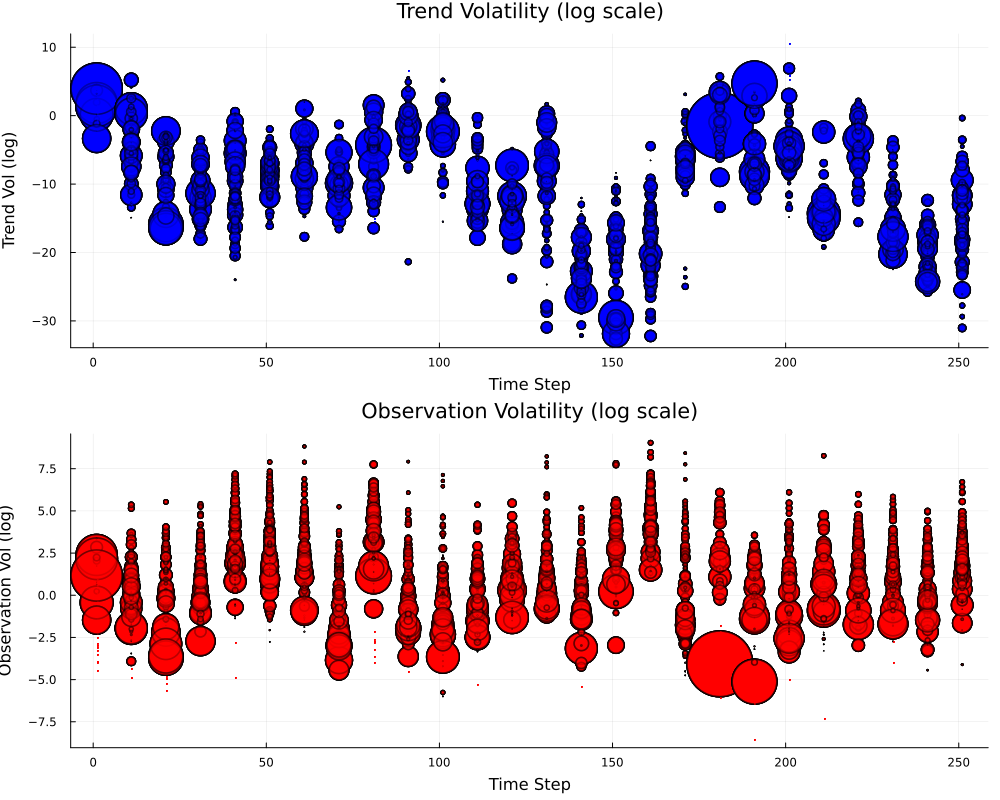

In [26]:
using LogExpFunctions: softmax  # converts log weights to normalised weights

# Extract particles and weights for visualisation
pf_history = pf_cb.container
n_particles = length(pf_history.particles[1])

# Create a plot showing particles over time
p_particles = plot(
    layout=(2, 1),
    size=(1000, 800),
    xlabel="Time Step",
    title=["Trend Volatility (log scale)" "Observation Volatility (log scale)"],
    legend=false
)

# Sample every 10th timestep to avoid overcrowding
time_indices = 1:10:K
for (idx, k) in enumerate(time_indices)
    # Get first 100 particles and weights at time k
    particles = pf_history.particles[k][1:100]
    log_weights = pf_history.weights[k][1:100]

    # Convert to normalized weights using softmax
    weights = softmax(log_weights)

    # Scale point sizes (multiply by constant for visibility)
    point_sizes = sqrt.(weights) .* 50

    # Extract volatility values (outer state: .x has first and second dimensions)
    vol1_particles = [p.x[1] for p in particles]
    vol2_particles = [p.x[2] for p in particles]

    # Plot particles with size proportional to weight
    scatter!(
        p_particles,
        fill(k, n_particles),
        vol1_particles,
        markersize=point_sizes,
        alpha=0.5,
        color=:blue,
        subplot=1
    )

    scatter!(
        p_particles,
        fill(k, n_particles),
        vol2_particles,
        markersize=point_sizes,
        alpha=0.5,
        color=:red,
        subplot=2
    )
end

ylabel!(p_particles[1], "Trend Vol (log)")
ylabel!(p_particles[2], "Observation Vol (log)")

display(p_particles)

The regular particle filter is actually a fairly poor algorithm for this model due to the moderate dimensionality of the latent state space. 

This can be seeing by plotting the relative effective sample size (ESS) of the particles over time.

The relative ESS of a particle collection is a measure of how many "effective" particles there are, taking into account the particle weights. 

For example, if all but one particle have negligible weight, the relative ESS will be close to $\frac{1}{N_\text{particles}}$, indicating that effectively only one particle is contributing to the estimate.

Conversely, if all particles have equal weight, the relative ESS will be 1, indicating that all particles are effectively contributing.

ESS matters because a low ESS indicates that the particle filter is struggling to represent the filtering distribution accurately and will result in higher variance estimates of the filtering distribution.

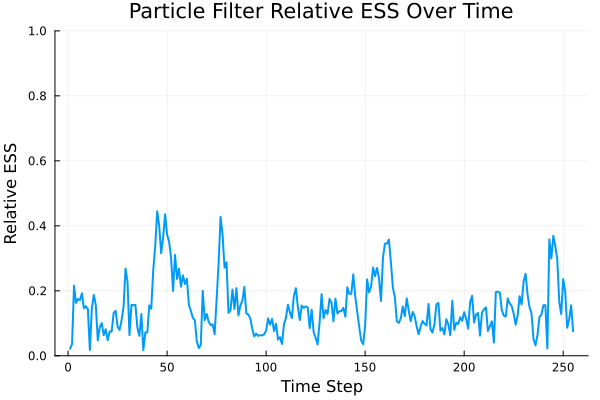

In [27]:
pf_esses = Vector{Float64}(undef, K)
for k in 1:K
    log_weights = pf_history.weights[k]
    weights = softmax(log_weights)
    pf_esses[k] = 1 / sum(weights .^ 2)
end

# Plot relative ESSes over time
p_ess = plot(
    1:K, pf_esses ./ N_particles,
    xlabel="Time Step",
    ylabel="Relative ESS",
    title="Particle Filter Relative ESS Over Time",
    legend=false,
    ylim=(0, 1),
    lw = 2
)

## Rao-Blackwellised Particle Filtering

Since our particle filter is struggling with the dimensionality of the full model, we can instead make use of Rao-Blackwellisation to reduce the effective dimensionality of the inference problem.

A hierarchical state space model can be Rao-Blackwellised when after conditioning on the outer dynamics, the remainder of the model has a closed-form filtering distribution.

This holds in our case since conditioning on the stochastic volatilities leaves us with a linear Gaussian state space model for which we can use the Kalman filter.

<img src="rb_model.svg" width="800px"/>

In our case, the dynamics look like this:
\begin{align*}
\log \sigma_{\eta, k} &= \log \sigma_{\eta, k-1} + \eta_{\text{trend}, k}, \quad &\eta_{\text{trend}, k} \sim \mathcal{N}(0, \tau_{\text{trend}}^2) \\
\log \sigma_{\epsilon, k} &= \log \sigma_{\epsilon, k-1} + \epsilon_{\text{obs}, k}, \quad &\epsilon_{\text{obs}, k} \sim \mathcal{N}(0, \tau_{\text{obs}}^2) \\
x_k &\sim A x_{k-1} + q_k, \quad &q_k \sim \mathcal{N}(0, Q_k(\sigma_{\eta, k})) \\
y_k &\sim H x_k + r_k, \quad &r_k \sim \mathcal{N}(0, R_k(\sigma_{\epsilon, k}))
\end{align*}

The `Q_k` and `R_k` matrices are now functions of the stochastic volatilities, which makes them time-varying, but crucially, the model remains linear-Gaussian when conditioned on the volatilities.

Quite amazingly, because of the design of `GeneralisedFilters.jl` no additional implementation work is required to implement a Rao-Blackwellised model. We just take the existing hierarchical model and swap out the particle filter for a Rao-Blackwellised particle filter. The necessary structure is already encoded in the model definition.

In [28]:
rbpf = RBPF(pf, kf);
rbpf_cb = DenseAncestorCallback(nothing)
GF.filter(rng, stoch_vol_model, rbpf, ys; callback=rbpf_cb);
rbpf_history = rbpf_cb.container;

Using the Rao-Blackwellised particle filter, we can see a dramatic improvement in the relative ESS over time.

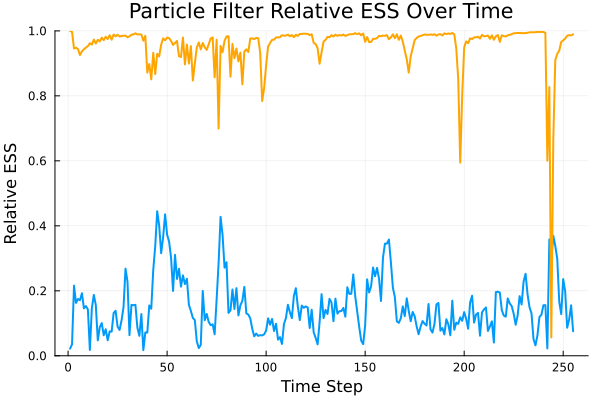

In [29]:
rbpf_esses = Vector{Float64}(undef, K)
for k in 1:K
    log_weights = rbpf_history.weights[k]
    weights = softmax(log_weights)
    rbpf_esses[k] = 1 / sum(weights .^ 2)
end 

# Add to existing ESS plot
plot!(
    p_ess,
    1:K, rbpf_esses ./ N_particles,
    label="RBPF",
    color=:orange,
    lw = 2
)

### First-Class Rao-Blackwellisation: Auxiliary RBPF

We now get to the real meat of `GeneralisedFilters.jl`: its first-class support for Rao-Blackwellisation.

Because the package natively supports Rao-Blackwellisation, any advanced efficiency techniques developed for standard particle filters can be directly applied to Rao-Blackwellised particle filters as well.

For example, we can we can turn out RBPF into an auxiliary RBPF.

An auxiliary particle filter (APF) is an extension of the standard particle filter that aims to improve performance by incorporating information about future observations into the resampling step.

It does this by introducing a light-weight "look-ahead" step that estimates how well each particle is likely to predict the next observation. This is either $p(y_{k+1} | x_k)$ or an approximation thereof.

It can then use this information to preferentially resample particles that are expected to perform well in the next time step, thereby improving the overall efficiency of the filter.

<img src="apf_diagram.png" width="600px"/>

Creating a auxiliary Rao-Blackwellised particle filter is as simple as swapping out the base RBPF with an auxiliary wrapper, specifying what method we want to use to compute the look-ahead weights.

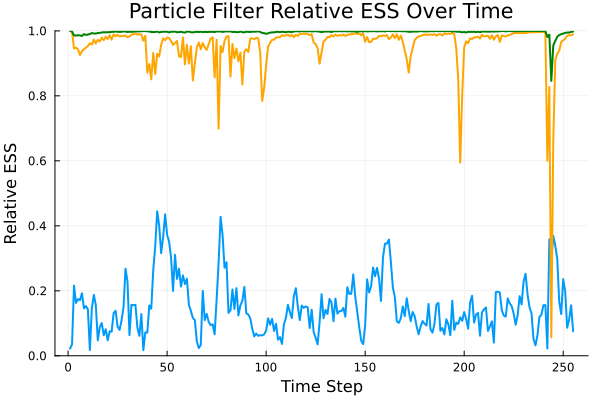

In [30]:
arbpf = AuxiliaryParticleFilter(rbpf, MeanPredictive())
arbpf_cb = DenseAncestorCallback(nothing)
GF.filter(rng, stoch_vol_model, arbpf, ys; callback=arbpf_cb);
arbpf_history = arbpf_cb.container
arbpf_esses = Vector{Float64}(undef, K)
for k in 1:K
    log_weights = arbpf_history.weights[k]
    weights = softmax(log_weights)
    arbpf_esses[k] = 1 / sum(weights .^ 2)
end

# Add to existing ESS plot
plot!(
    p_ess,
    1:K, arbpf_esses ./ N_particles,
    label="Auxiliary RBPF",
    color=:green,
    lw = 2
)

It's important to emphasise that a Aux-RBPF implementation is non-trivial. It requires a special calculation of the look-ahead weights that takes into account the closed-form filtering distribution of the inner model.

Yet, all of this complexity is handled automatically by `GeneralisedFilters.jl`, allowing users to easily leverage advanced techniques with minimal effort.

Now that we've arrived at a strong filtering algorithm, we plot the filtered trend inflation and stochastic volatilities alongside the observed data.

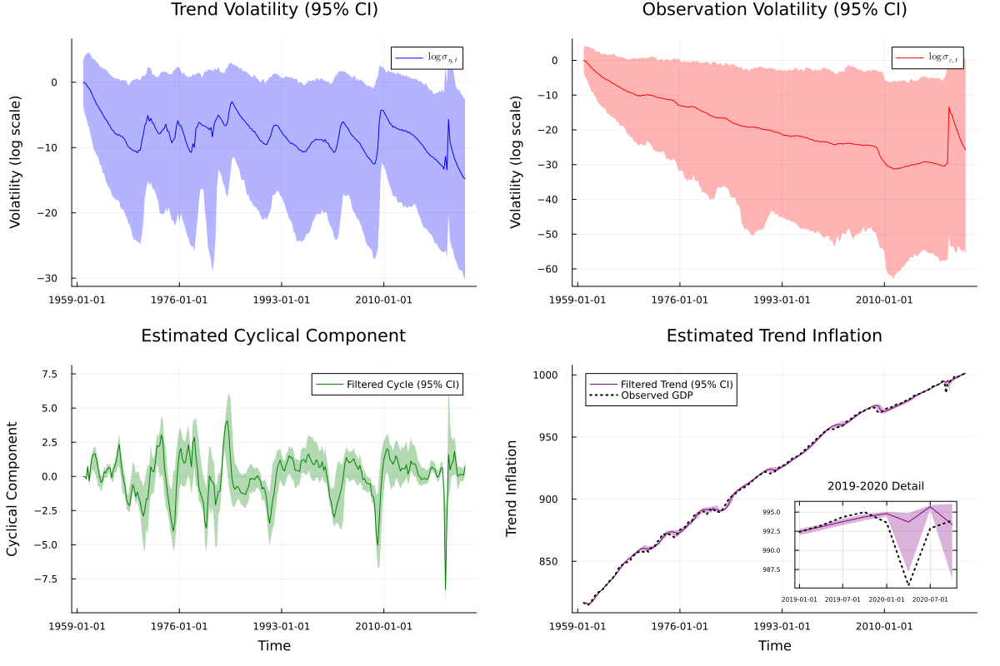

In [31]:
# Extract RBPF posteriors for visualization
using Statistics
using LaTeXStrings

# Helper function to compute weighted statistics and credible intervals
function compute_weighted_stats(particles, log_weights, extractor_fn)
    weights = softmax(log_weights)
    vals = [extractor_fn(p) for p in particles]
    
    # Weighted mean
    mean_val = sum(weights .* vals)
    
    # 95% credible interval
    sorted_idx = sortperm(vals)
    cumsum_weights = cumsum(weights[sorted_idx])
    lower_idx = findfirst(x -> x >= 0.025, cumsum_weights)
    upper_idx = findfirst(x -> x >= 0.975, cumsum_weights)
    lower_val = vals[sorted_idx[lower_idx]]
    upper_val = vals[sorted_idx[upper_idx]]
    
    return mean_val, lower_val, upper_val
end

# Extract statistics for all time steps
function extract_timeseries(history, extractor_fn)
    K = length(history.particles) - 1
    means = Vector{Float64}(undef, K)
    lowers = Vector{Float64}(undef, K)
    uppers = Vector{Float64}(undef, K)
    
    for k in 1:K
        means[k], lowers[k], uppers[k] = compute_weighted_stats(
            history.particles[k], history.weights[k], extractor_fn
        )
    end
    
    return means, lowers, uppers
end

# Extract all time series
rbpf_vol1_means, rbpf_vol1_lower, rbpf_vol1_upper = extract_timeseries(rbpf_history, p -> p.x[1])
rbpf_vol2_means, rbpf_vol2_lower, rbpf_vol2_upper = extract_timeseries(rbpf_history, p -> p.x[2])
rbpf_trend_means, rbpf_trend_lower, rbpf_trend_upper = extract_timeseries(rbpf_history, p -> p.z.μ[1])
rbpf_cycle_means, rbpf_cycle_lower, rbpf_cycle_upper = extract_timeseries(rbpf_history, p -> p.z.μ[3])

# Create 2x2 panel plot
p_rbpf = plot(layout=(2, 2), size=(1200, 800), link=:x, margin=5mm)

# Top-left: Trend volatility
plot!(
    p_rbpf, fred_data.date, rbpf_vol1_means,
    ribbon=(rbpf_vol1_means .- rbpf_vol1_lower, rbpf_vol1_upper .- rbpf_vol1_means),
    label=L"\log \sigma_{\eta,t}", fillalpha=0.3, color=:blue, subplot=1,
    ylabel="Volatility (log scale)", title="Trend Volatility (95% CI)", legend=:topright
)

# Top-right: Observation volatility
plot!(
    p_rbpf, fred_data.date, rbpf_vol2_means,
    ribbon=(rbpf_vol2_means .- rbpf_vol2_lower, rbpf_vol2_upper .- rbpf_vol2_means),
    label=L"\log \sigma_{\varepsilon,t}", fillalpha=0.3, color=:red, subplot=2,
    ylabel="Volatility (log scale)", title="Observation Volatility (95% CI)", legend=:topright
)

# Bottom-left: Cyclical component
plot!(
    p_rbpf, fred_data.date, rbpf_cycle_means,
    ribbon=(rbpf_cycle_means .- rbpf_cycle_lower, rbpf_cycle_upper .- rbpf_cycle_means),
    label="Filtered Cycle (95% CI)", fillalpha=0.3, color=:green, subplot=3,
    xlabel="Time", ylabel="Cyclical Component", title="Estimated Cyclical Component", legend=:best
)

# Bottom-right: Trend inflation with inset
plot!(
    p_rbpf, fred_data.date, rbpf_trend_means,
    ribbon=(rbpf_trend_means .- rbpf_trend_lower, rbpf_trend_upper .- rbpf_trend_means),
    label="Filtered Trend (95% CI)", fillalpha=0.3, color=:purple, subplot=4,
    xlabel="Time", ylabel="Trend Inflation", title="Estimated Trend Inflation", legend=:best
)

plot!(p_rbpf, fred_data.date, fred_data.gdp, label="Observed GDP", 
      linestyle=:dot, linewidth=2, color=:black, subplot=4)

# Create inset plot for 2019-2020
inset_indices = findall(x -> year(x) >= 2019 && year(x) <= 2020, fred_data.date)
plot!(p_rbpf, inset=(4, bbox(0.05, 0.1, 0.4, 0.35, :bottom, :right)), subplot=5, bg_inside=:white)

plot!(
    fred_data.date[inset_indices], rbpf_trend_means[inset_indices],
    ribbon=(rbpf_trend_means[inset_indices] .- rbpf_trend_lower[inset_indices], 
            rbpf_trend_upper[inset_indices] .- rbpf_trend_means[inset_indices]),
    subplot=5, label="", fillalpha=0.3, color=:purple, xlabel="", ylabel="",
    title="2019-2020 Detail", titlefontsize=9, tickfontsize=5, framestyle=:box
)

plot!(fred_data.date[inset_indices], fred_data.gdp[inset_indices], subplot=5, 
      label="", linestyle=:dot, linewidth=2, color=:black)

display(p_rbpf)

## Parameter Inference with Turing.jl

Returning to our fixed volatility model, we can use our Kalman filter as a component in a Turing.jl model to perform parameter inference on this volatility parameter.

All `GeneralisedFilters.jl` filters return both a filtered distribution object and the log-likelihood of the observed data given the model parameters.

In the case of analytical filters (e.g., the Kalman filter), this log-likelihood is exact, whereas for particle filters it is an unbiased estimate.

This value can be incorporated into a Turing.jl model using the `@addlogprob!` macro.

In [32]:
using Turing

@model function volatility_model(ys::AbstractVector{<:Vector})
    # Priors for log-volatilities
    log_vol_trend ~ Normal(-5.0, 5.0)
    log_vol_obs ~ Normal(-10.0, 10.0)
    
    # Create volatility vector
    vols = [log_vol_trend, log_vol_obs]

    # Compute log-likelihood using Kalman filter
    state, ll = GF.filter(
        rng,
        bandpass_model,
        kf,
        ys;
        new_outer=vols,
    )

    Turing.@addlogprob! ll
    
    return state
end;


SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up


We perform inference using the Metropolis-Hastings algorithm so we don't have to worry about the differentiability of the log-likelihood estimate.

Making all `GeneralisedFilters.jl` filters compatible with automatic differentiation is an ongoing area of development.

In [33]:
using AdvancedMH

model = volatility_model(ys)
spl = RWMH(MvNormal(zeros(2), diagm([0.2, 8.0])))
setprogress!(false)
chain = sample(
    model, 
    externalsampler(spl), 
    2000;
    param_names=["log_vol_trend", "log_vol_obs"], 
    discard_initial=500
);

┌ Info: [Turing]: progress logging is disabled globally
└ @ Turing /home/zelda/th542/.julia/packages/Turing/Ak3CD/src/Turing.jl:39


In [34]:
# Trace plot of the MCMC samples
using StatsPlots
plot(chain, margin=5mm)

ArgumentError: ArgumentError: Package StatsPlots not found in current path.
- Run `import Pkg; Pkg.add("StatsPlots")` to install the StatsPlots package.

It's also possible to use particle filter log-likelihoods within Turing.jl. This becomes a pseudo-marginal MCMC scheme—even though the log-likelihood is an unbiased estimate Metropolis-Hastings remains valid.

In the future we plan to implement more advanced support for using `GeneralisedFilters.jl` within Turing.jl, including particle Gibbs schemes and adaptation schemes for pseudo-marginal methods.

### Scratching the Surface: Particle Gibbs with Ancestor Sampling

A powerful and unique feature of `GeneralisedFilters.jl` is its support for Rao-Blackwellisation with the particle Gibbs algorithm, particularly when used with ancestor sampling or backward simulation. This allows for highly efficient parameter inference and is the gold-standard approach for many state space models.

Particle Gibbs is already a rather complicated algorithm that is rarely implemented in probabilistic programming frameworks. Rao-Blackwellisation adds an additional layer of complexity, and as far as we are aware `GeneralisedFilters.jl` is the only package to provide this functionality.

A discussion of Particle Gibbs requires a bit of background so is not entirely suitable for this introductory notebook. However, we will soon be realising a comprehensive tutorial implemented Rao-Blackwellised PGAS with `GeneralisedFilters.jl` soon.